In [1]:
!nvidia-smi

Wed Dec  4 03:05:42 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8              11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
!pip install ultralytics==8.2.103 -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 875.1/875.1 kB 26.7 MB/s eta 0:00:00


In [2]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image, display
import ultralytics

from ultralytics import YOLO

In [4]:
ultralytics.checks()
HOME = os.getcwd()
print(HOME)

Ultralytics YOLOv8.2.103 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 32.6/112.6 GB disk)
/content


# Training

### Download dataset

In [5]:
!mkdir -p {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow==1.1.48 --quiet

from roboflow import Roboflow
rf = Roboflow(api_key="y4zdpJpEwhsgG02jsyut")
project = rf.workspace("whop-qepf3").project("accident-detection-tugas-akhir")
version = project.version(50)
dataset = version.download("yolov8")


/content/datasets
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.3/80.3 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.2 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Accident-Detection-Tugas-Akhir-50 in yolov8:: 100%|██████████| 6994/6994 [00:01<00:00, 4023.81it/s]


In [6]:
train_images_path = os.path.join(dataset.location, "train/images")
train_labels_path = os.path.join(dataset.location, "train/labels")

valid_images_path = os.path.join(dataset.location, "valid/images")
valid_labels_path = os.path.join(dataset.location, "valid/labels")

test_images_path = os.path.join(dataset.location, "test/images")
test_labels_path = os.path.join(dataset.location, "test/labels")

def count_labels(label_path):
    accident_count = 0
    non_accident_count = 0
    for file in os.listdir(label_path):
        if file.endswith('.txt'):
            with open(os.path.join(label_path, file), 'r') as f:
                lines = f.readlines()
                for line in lines:
                    class_id = int(line.split()[0])  # ID kelas di kolom pertama
                    if class_id == 0:  # 0 untuk accident
                        accident_count += 1
                    elif class_id == 1:  # 1 untuk non-accident
                        non_accident_count += 1
    return accident_count, non_accident_count

def count_images(image_path):
    return len([file for file in os.listdir(image_path) if file.endswith(('.png', '.jpg', '.jpeg'))])

train_accident, train_non_accident = count_labels(train_labels_path)
valid_accident, valid_non_accident = count_labels(valid_labels_path)
test_accident, test_non_accident = count_labels(test_labels_path)

train_images = count_images(train_images_path)
valid_images = count_images(valid_images_path)
test_images = count_images(test_images_path)

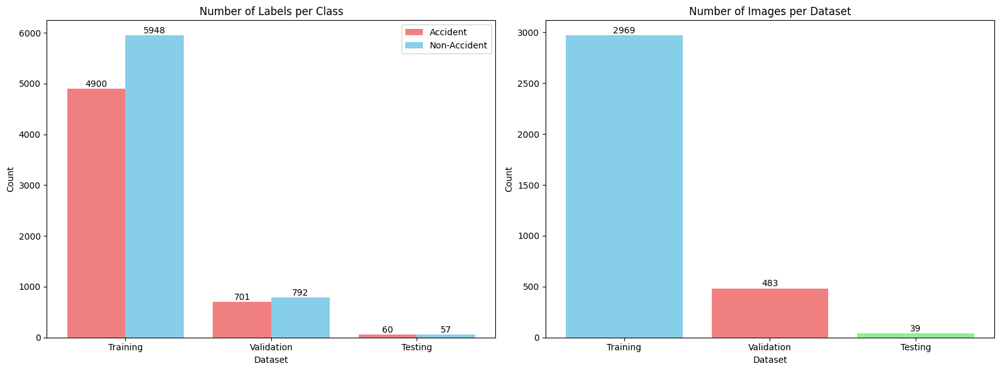


Training - Accident: 4900, Non-Accident: 5948, Images: 2969
Validation - Accident: 701, Non-Accident: 792, Images: 483
Testing - Accident: 60, Non-Accident: 57, Images: 39


In [7]:
# Data untuk visualisasi
labels = ['Training', 'Validation', 'Testing']
accident_counts = [train_accident, valid_accident, test_accident]
non_accident_counts = [train_non_accident, valid_non_accident, test_non_accident]
image_counts = [train_images, valid_images, test_images]

# Buat plot
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot jumlah label
x = range(len(labels))
width = 0.4
axes[0].bar(x, accident_counts, width, label='Accident', color='lightcoral')
axes[0].bar([p + width for p in x], non_accident_counts, width, label='Non-Accident', color='skyblue')
axes[0].set_title('Number of Labels per Class')
axes[0].set_xlabel('Dataset')
axes[0].set_ylabel('Count')
axes[0].set_xticks([p + width / 2 for p in x])
axes[0].set_xticklabels(labels)
axes[0].legend()

for i, (acc, non_acc) in enumerate(zip(accident_counts, non_accident_counts)):
    axes[0].text(i, acc + 2, str(acc), ha='center', va='bottom')
    axes[0].text(i + width, non_acc + 2, str(non_acc), ha='center', va='bottom')

# Plot jumlah gambar
axes[1].bar(labels, image_counts, color=['skyblue', 'lightcoral', 'lightgreen'])
axes[1].set_title('Number of Images per Dataset')
axes[1].set_xlabel('Dataset')
axes[1].set_ylabel('Count')

for i, v in enumerate(image_counts):
    axes[1].text(i, v + 2, str(v), ha='center', va='bottom')

# Tampilkan plot
plt.tight_layout()
plt.show()

# Cetak hasil
print(f"\nTraining - Accident: {train_accident}, Non-Accident: {train_non_accident}, Images: {train_images}")
print(f"Validation - Accident: {valid_accident}, Non-Accident: {valid_non_accident}, Images: {valid_images}")
print(f"Testing - Accident: {test_accident}, Non-Accident: {test_non_accident}, Images: {test_images}")

## Custom Training

In [ ]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=25 imgsz=800 plots=True workers=12 show=True lr0=0.000016 optimizer=AdamW

/content
100% 21.5M/21.5M [00:00<00:00, 42.0MB/s]
New https://pypi.org/project/ultralytics/8.3.40 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.103 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/datasets/Accident-Detection-Tugas-Akhir-50/data.yaml, epochs=25, time=None, patience=100, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=12, project=None, name=train, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=Fals

/content


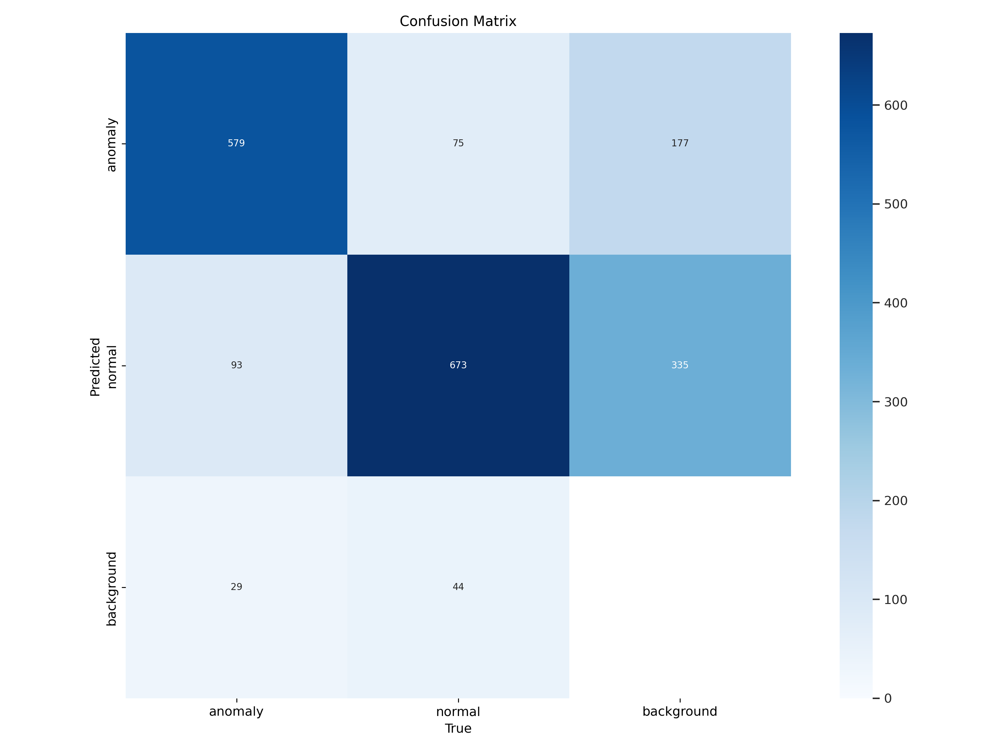

In [10]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=600)

## Validate Custom Model

/content


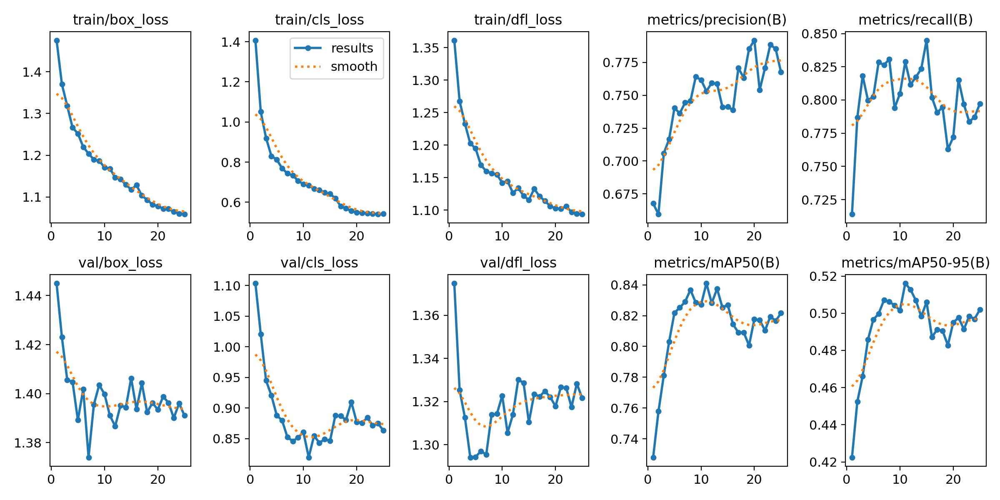

In [11]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/results.png', width=600)

In [40]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml save=True

/content
Ultralytics YOLOv8.2.103 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,126,358 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/datasets/Accident-Detection-Tugas-Akhir-50/valid/labels.cache... 483 images, 2 backgrounds, 0 corrupt: 100% 483/483 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 31/31 [00:08<00:00,  3.64it/s]
                   all        483       1493      0.753       0.83      0.841      0.516
               anomaly        392        701      0.803      0.823      0.863      0.515
                normal        266        792      0.703      0.837      0.819      0.518
Speed: 0.5ms preprocess, 9.2ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to runs/detect/val2
💡 Learn more at https://docs.ultralytics.com/modes/val


In [34]:
def plot_predictions_and_labels(pred_image_path, label_image_path, save_path):
    pred_img = cv2.imread(pred_image_path)
    label_img = cv2.imread(label_image_path)

    pred_img_rgb = cv2.cvtColor(pred_img, cv2.COLOR_BGR2RGB)
    label_img_rgb = cv2.cvtColor(label_img, cv2.COLOR_BGR2RGB)

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    axes[0].imshow(pred_img_rgb)
    axes[0].set_title("Validation")
    axes[0].axis('off')

    axes[1].imshow(label_img_rgb)
    axes[1].set_title("Ground Truth")
    axes[1].axis('off')

    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()

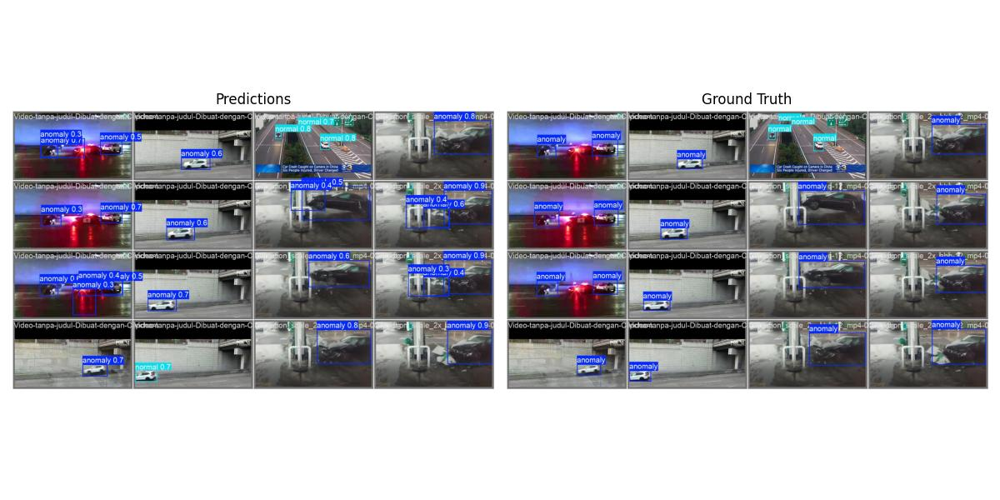

In [37]:
pred_image_path = f'{HOME}/runs/detect/train/val_batch0_pred.jpg'
label_image_path = f'{HOME}/runs/detect/train/val_batch0_labels.jpg'

combined_image_path = f'{HOME}/runs/detect/train/val_batch0_combined.jpg'

plot_predictions_and_labels(pred_image_path, label_image_path, combined_image_path)

Image(filename=combined_image_path, width=600)

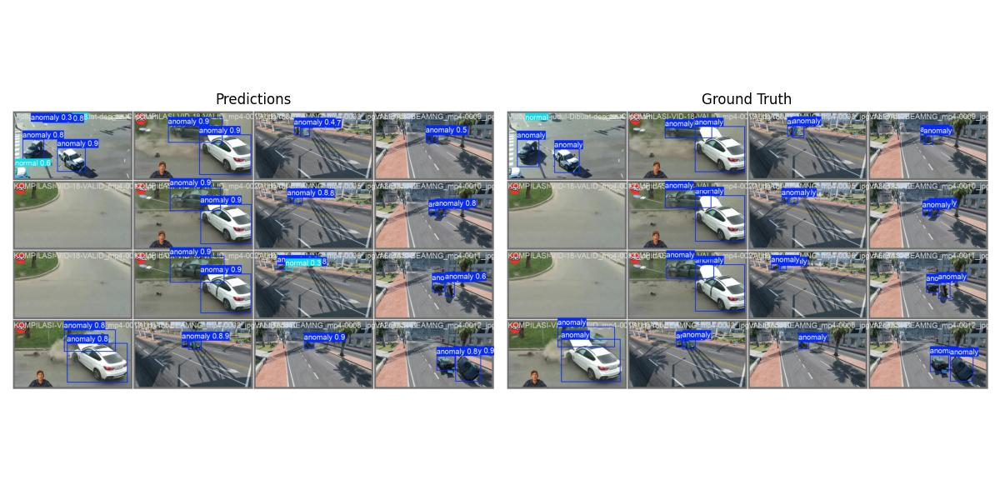

In [38]:
pred_image_path = f'{HOME}/runs/detect/train/val_batch1_pred.jpg'
label_image_path = f'{HOME}/runs/detect/train/val_batch1_labels.jpg'

combined_image_path = f'{HOME}/runs/detect/train/val_batch1_combined.jpg'

plot_predictions_and_labels(pred_image_path, label_image_path, combined_image_path)

Image(filename=combined_image_path, width=600)

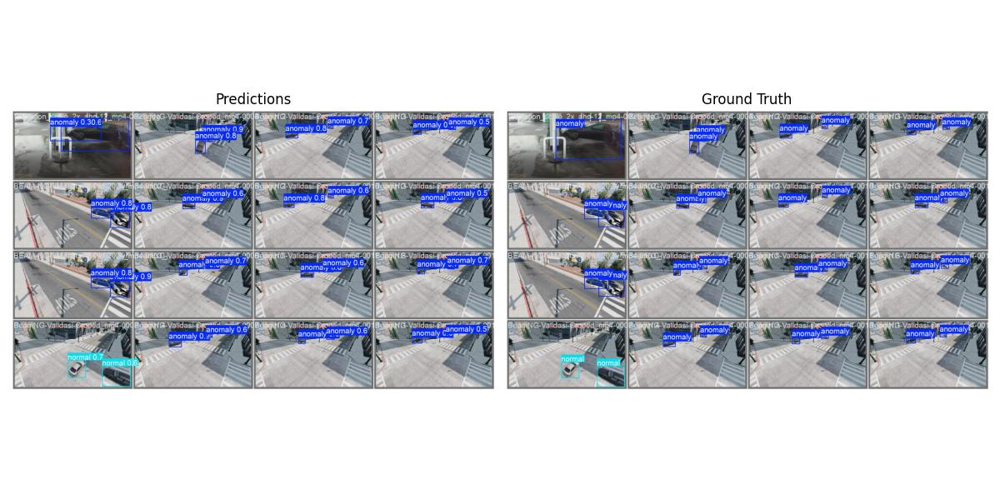

In [39]:
pred_image_path = f'{HOME}/runs/detect/train/val_batch2_pred.jpg'
label_image_path = f'{HOME}/runs/detect/train/val_batch2_labels.jpg'

combined_image_path = f'{HOME}/runs/detect/train/val_batch2_combined.jpg'

plot_predictions_and_labels(pred_image_path, label_image_path, combined_image_path)

Image(filename=combined_image_path, width=600)

/content


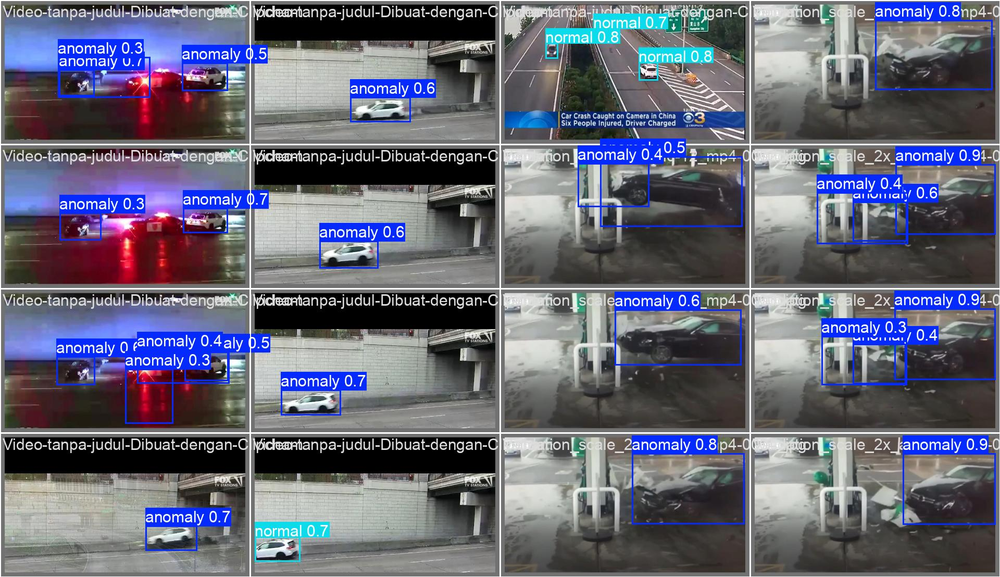

In [12]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch0_pred.jpg', width=600)

/content


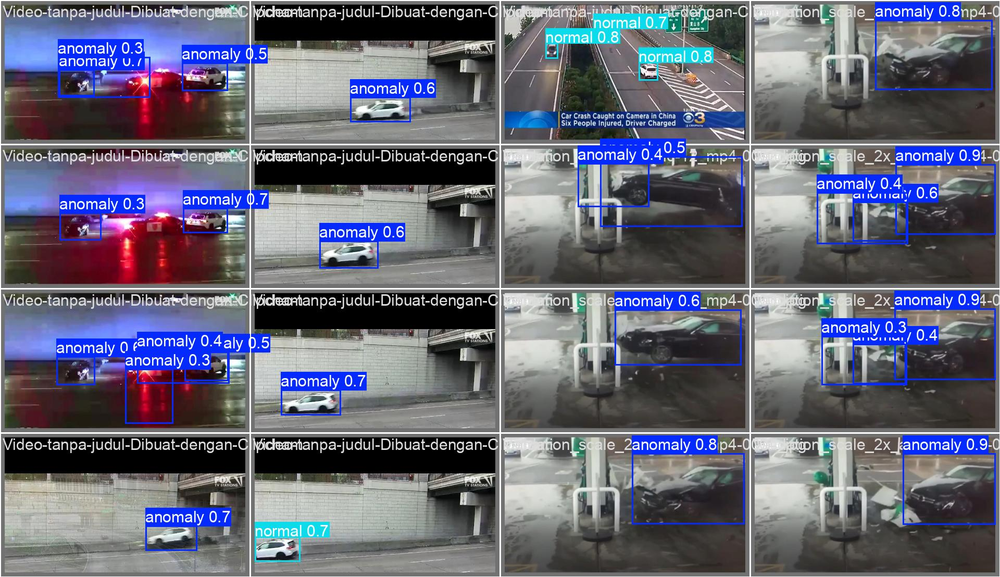

In [32]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch1_pred.jpg', width=600)

/content


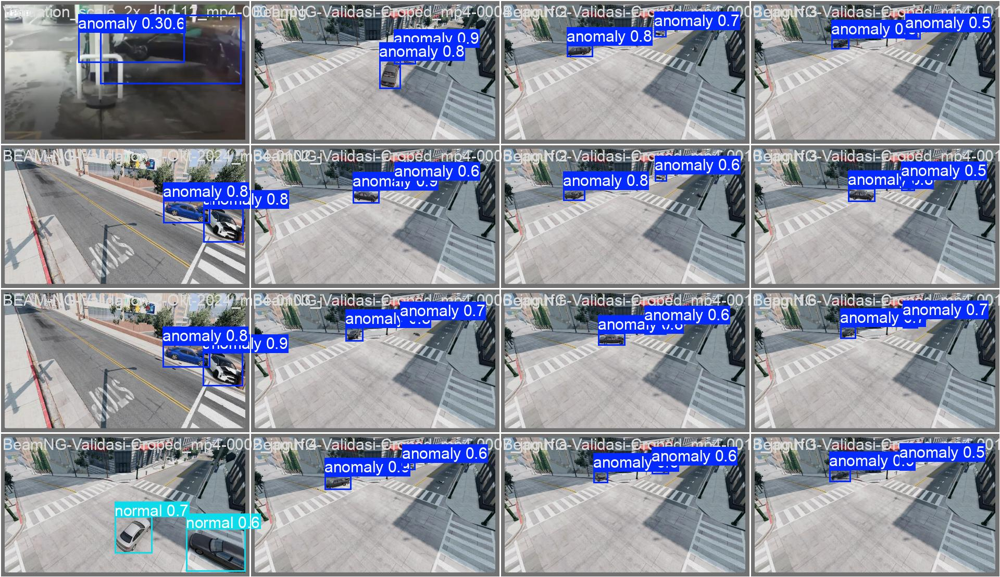

In [33]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch2_pred.jpg', width=600)

# Analisis Training


image 1/1 d:\Source Codes\Tugas Akhir\analyst\detection_yolo\..\detection_yolo\datasets\Accident-Detection-Tugas-Akhir-50\test\images\KOMPILASI-VID-13-TEST_mp4-0000_jpg.rf.3f92b4f21adc83f9afe49642547aa106.jpg: 480x800 2 anomalys, 64.4ms
Speed: 4.1ms preprocess, 64.4ms inference, 4.8ms postprocess per image at shape (1, 3, 480, 800)
KOMPILASI-VID-13-TEST_mp4-0000_jpg.rf.3f92b4f21adc83f9afe49642547aa106.jpg: Mean IoU = 0.81, Mean Confidence = 0.83

image 1/1 d:\Source Codes\Tugas Akhir\analyst\detection_yolo\..\detection_yolo\datasets\Accident-Detection-Tugas-Akhir-50\test\images\KOMPILASI-VID-13-TEST_mp4-0002_jpg.rf.f7f714a819a7b295906496c1296b8dc4.jpg: 480x800 1 anomaly, 4 normals, 56.5ms
Speed: 13.1ms preprocess, 56.5ms inference, 5.5ms postprocess per image at shape (1, 3, 480, 800)
KOMPILASI-VID-13-TEST_mp4-0002_jpg.rf.f7f714a819a7b295906496c1296b8dc4.jpg: Mean IoU = 0.74, Mean Confidence = 0.72

image 1/1 d:\Source Codes\Tugas Akhir\analyst\detection_yolo\..\detection_yolo\dataset

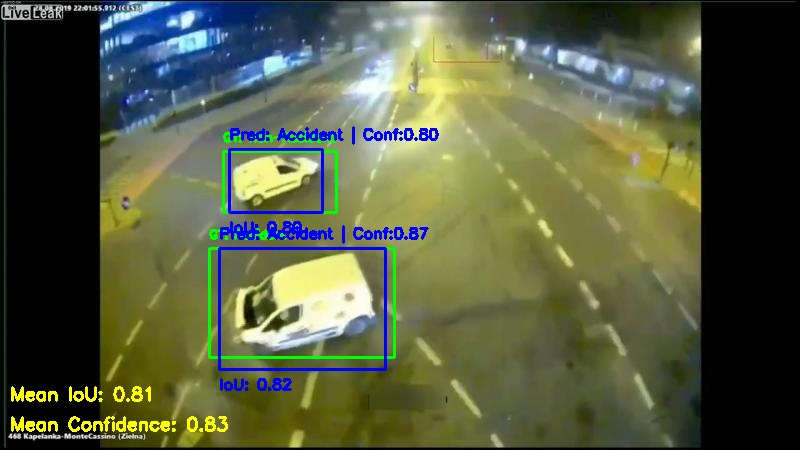

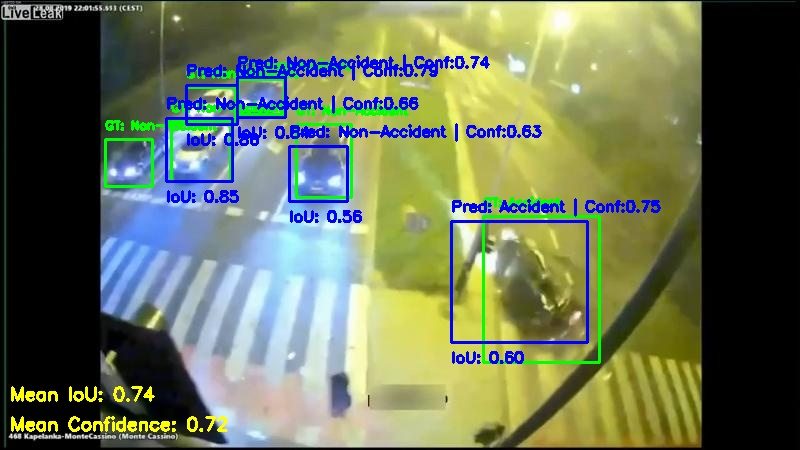

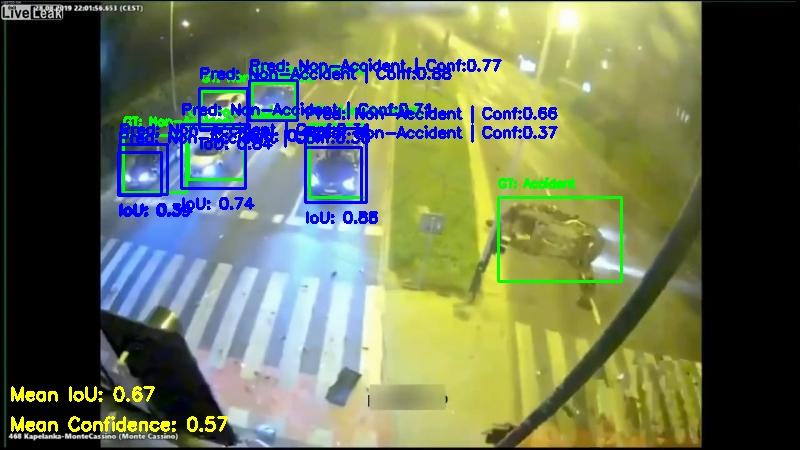

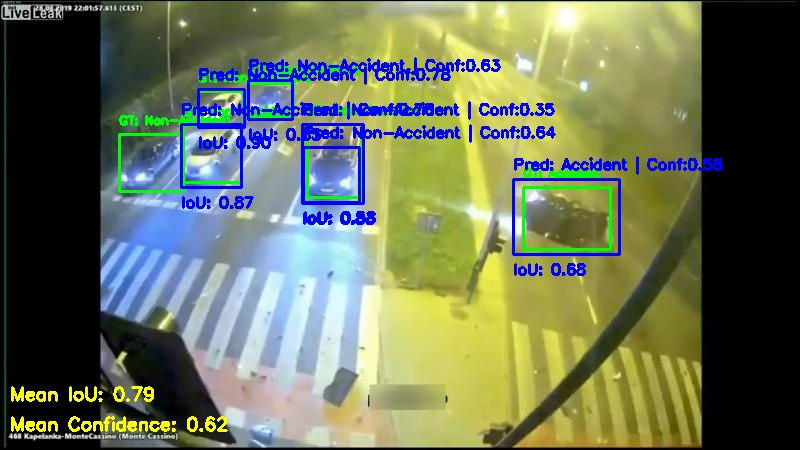

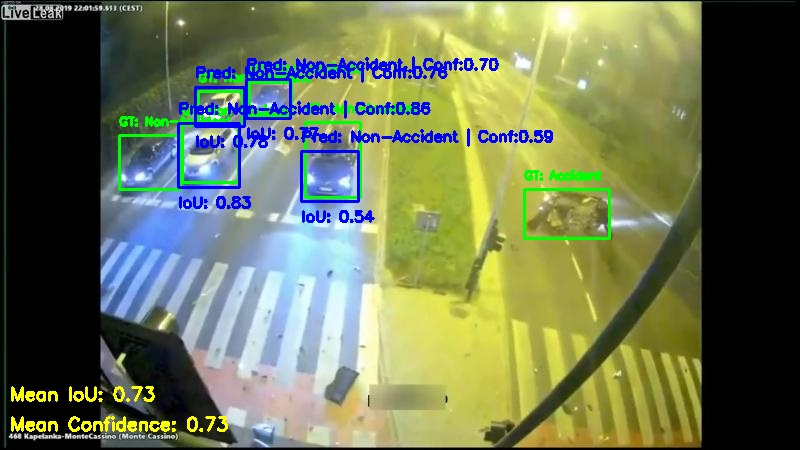

...

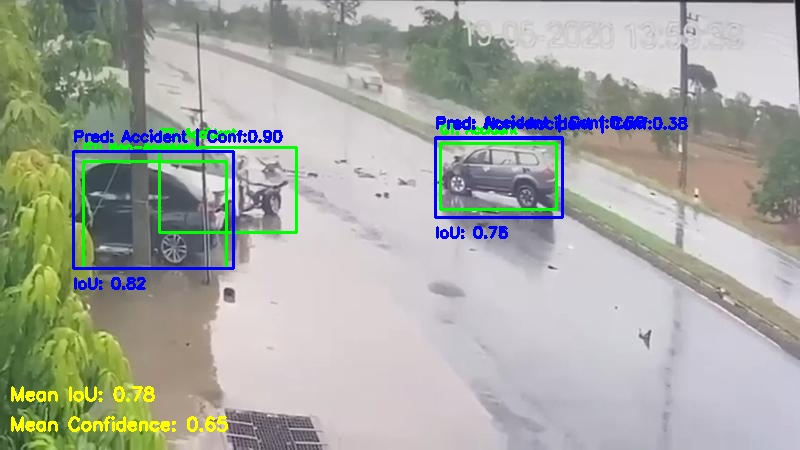

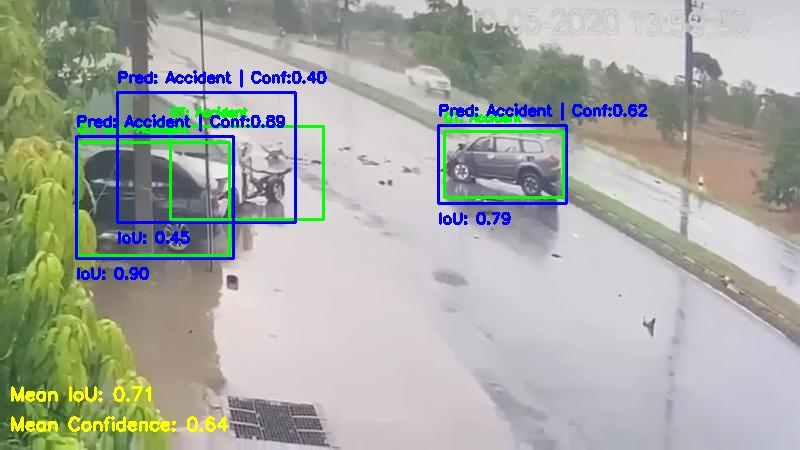

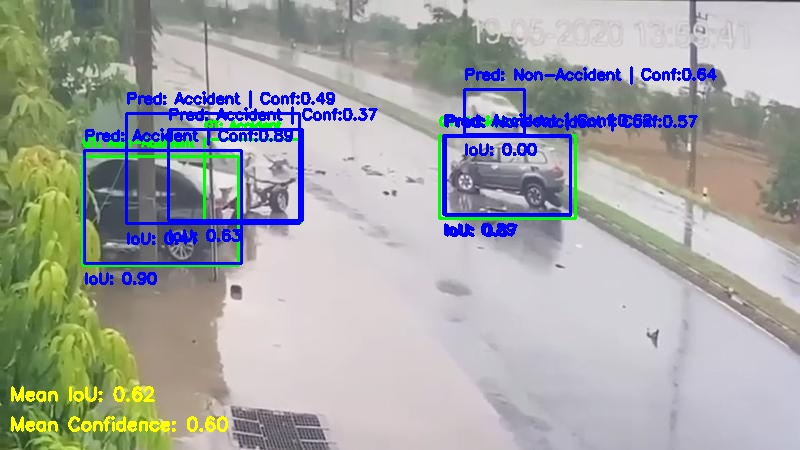

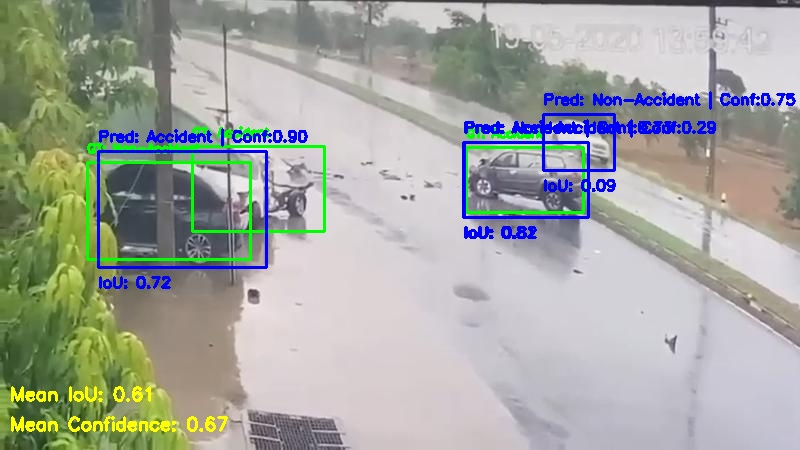

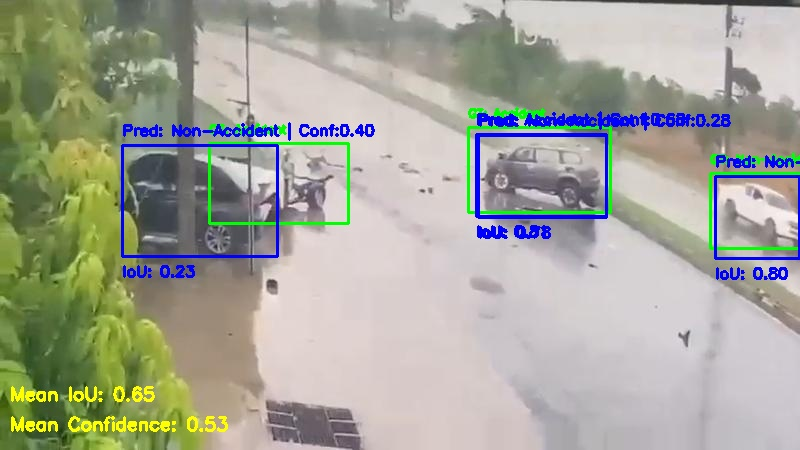

In [4]:
def calculate_iou(box1, box2):
    x1_min, y1_min, x1_max, y1_max = box1
    x2_min, y2_min, x2_max, y2_max = box2

    inter_x1 = max(x1_min, x2_min)
    inter_y1 = max(y1_min, y2_min)
    inter_x2 = min(x1_max, x2_max)
    inter_y2 = min(y1_max, y2_max)

    inter_area = max(0, inter_x2 - inter_x1) * max(0, inter_y2 - inter_y1)
    box1_area = (x1_max - x1_min) * (y1_max - y1_min)
    box2_area = (x2_max - x2_min) * (y2_max - y2_min)
    union_area = box1_area + box2_area - inter_area

    iou = inter_area / union_area if union_area > 0 else 0
    return iou

def analyze_images(model, images_path, labels_path, output_dir="analyst"):
    os.makedirs(output_dir, exist_ok=True)
    image_files = [f for f in os.listdir(images_path) if f.endswith(('.png', '.jpg', '.jpeg'))]
    analyzed_images = []

    all_ious = []
    all_confidences = []

    for image_file in image_files:
        image_path = os.path.join(images_path, image_file)
        label_file = os.path.join(labels_path, image_file[:-4] + ".txt")

        img = cv2.imread(image_path)
        results = model.predict(source=image_path, conf=0.25)
        result = results[0]
        boxes = result.boxes

        # Ground truth bounding boxes
        ground_truth_boxes = []
        if os.path.exists(label_file):
            with open(label_file, 'r') as f:
                for line in f:
                    class_id, x_center, y_center, width, height = map(float, line.strip().split())
                    img_width, img_height = img.shape[1], img.shape[0]
                    x_min = int((x_center - width / 2) * img_width)
                    y_min = int((y_center - height / 2) * img_height)
                    x_max = int((x_center + width / 2) * img_width)
                    y_max = int((y_center + height / 2) * img_height)
                    ground_truth_boxes.append((x_min, y_min, x_max, y_max, int(class_id)))
                    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
                    class_labels = {0: "Accident", 1: "Non-Accident"}
                    label = class_labels.get(int(class_id), "Unknown")
                    cv2.putText(img, f'GT: {label}', (x_min, y_min - 10),
                                cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0, 255, 0), 2)

        ious = []
        confidences = []  # To store confidences for this image
        for box in boxes:
            confidence = box.conf.item()
            confidences.append(confidence)  # Append confidence for averaging
            cls = int(box.cls.item())
            x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
            cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
            class_labels = {0: "Accident", 1: "Non-Accident"}
            label = class_labels.get(cls, "Unknown")
            cv2.putText(img, f'Pred: {label} | Conf:{confidence:.2f}', (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)


            max_iou = 0
            for gt_box in ground_truth_boxes:
                gt_x1, gt_y1, gt_x2, gt_y2, gt_class = gt_box
                iou = calculate_iou((gt_x1, gt_y1, gt_x2, gt_y2), (x1, y1, x2, y2))
                max_iou = max(max_iou, iou)
            ious.append(max_iou)
            cv2.putText(img, f'IoU: {max_iou:.2f}', (x1, y2 + 20),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

        avg_iou = np.mean(ious) if ious else 0
        avg_confidence = np.mean(confidences) if confidences else 0  # Average confidence

        all_ious.extend(ious)  # Add current IoUs to the overall list
        all_confidences.extend(confidences)  # Add current confidences to the overall list

        print(f'{image_file}: Mean IoU = {avg_iou:.2f}, Mean Confidence = {avg_confidence:.2f}')

        # Display average confidence on the image
        cv2.putText(img, f'Mean Confidence: {avg_confidence:.2f}', (10, img.shape[0] - 20),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 255), 2)
        cv2.putText(img, f'Mean IoU: {avg_iou:.2f}', (10, img.shape[0] - 50),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 255), 2)

        output_path = os.path.join(output_dir, image_file)
        cv2.imwrite(output_path, img)
        analyzed_images.append(output_path)

    # Calculate and print overall averages
    overall_avg_iou = np.mean(all_ious) if all_ious else 0
    overall_avg_confidence = np.mean(all_confidences) if all_confidences else 0
    print(f'Overall: Average IoU = {overall_avg_iou:.2f}, Average Confidence = {overall_avg_confidence:.2f}')

    return analyzed_images

# Paths to test images and labels
test_images_path = "../detection_yolo/datasets/Accident-Detection-Tugas-Akhir-50/test/images"
test_labels_path = "../detection_yolo/datasets/Accident-Detection-Tugas-Akhir-50/test/labels"

# Load the YOLO model
model = YOLO("../detection_yolo/runs/detect/train/weights/best.pt")

# Analyze images
analyzed_images_paths = analyze_images(model, test_images_path, test_labels_path)

# Display the analyzed images
for img_path in analyzed_images_paths:
    display(Image(filename=img_path))


## Inferensi Model

In [27]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.6 source={dataset.location}/test/images save=True

/content
Ultralytics YOLOv8.2.103 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,126,358 parameters, 0 gradients, 28.4 GFLOPs

image 1/39 /content/datasets/Accident-Detection-Tugas-Akhir-50/test/images/KOMPILASI-VID-13-TEST_mp4-0000_jpg.rf.3f92b4f21adc83f9afe49642547aa106.jpg: 480x800 2 anomalys, 68.0ms
image 2/39 /content/datasets/Accident-Detection-Tugas-Akhir-50/test/images/KOMPILASI-VID-13-TEST_mp4-0002_jpg.rf.f7f714a819a7b295906496c1296b8dc4.jpg: 480x800 1 anomaly, 4 normals, 15.6ms
image 3/39 /content/datasets/Accident-Detection-Tugas-Akhir-50/test/images/KOMPILASI-VID-13-TEST_mp4-0003_jpg.rf.083f22c52f8a2e71b707f893596c2da9.jpg: 480x800 4 normals, 15.5ms
image 4/39 /content/datasets/Accident-Detection-Tugas-Akhir-50/test/images/KOMPILASI-VID-13-TEST_mp4-0004_jpg.rf.f2251f763768aca9bc41a48627c25d19.jpg: 480x800 4 normals, 15.5ms
image 5/39 /content/datasets/Accident-Detection-Tugas-Akhir-50/test/images/KOMPILASI-VID-13-TEST_mp

**NOTE:** Let's take a look at few results.

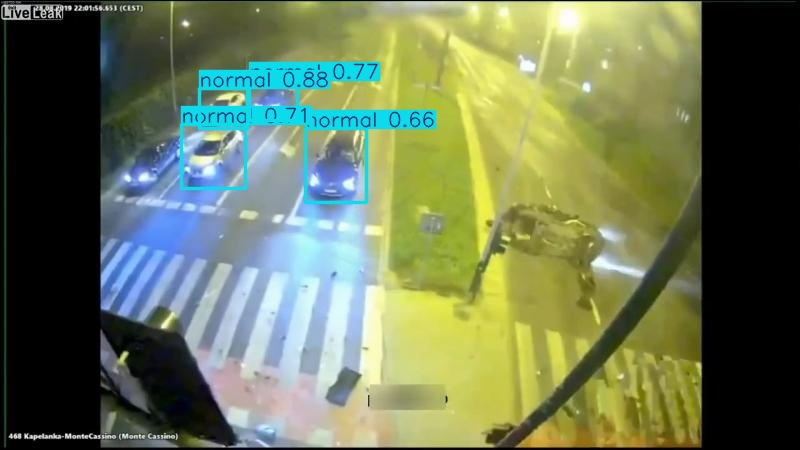

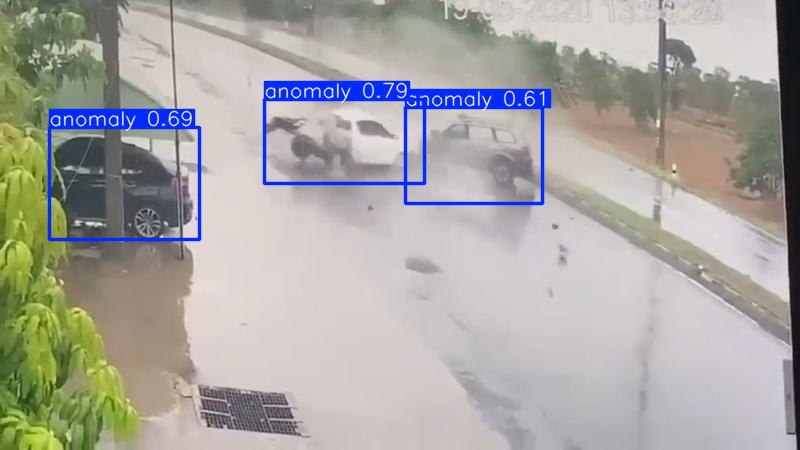

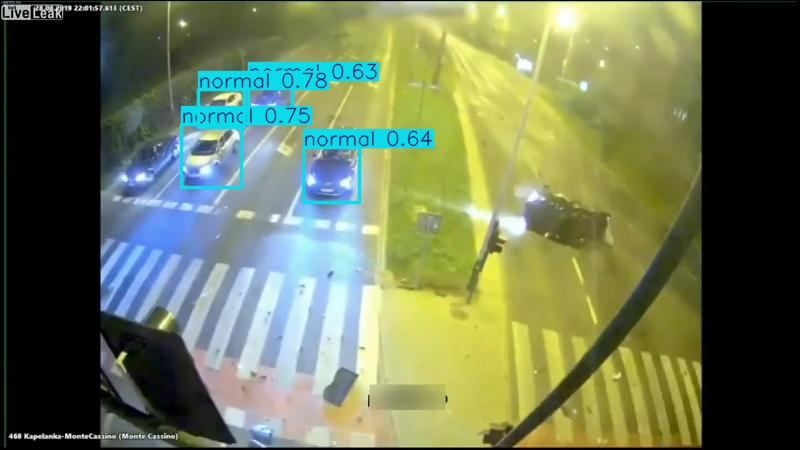

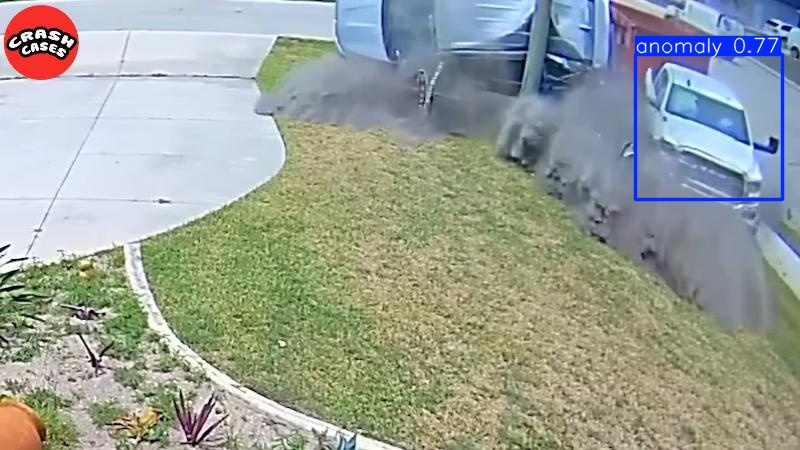

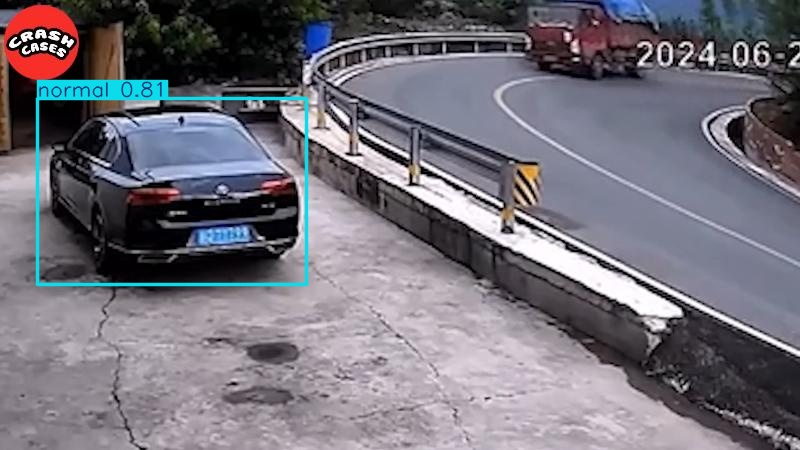

...

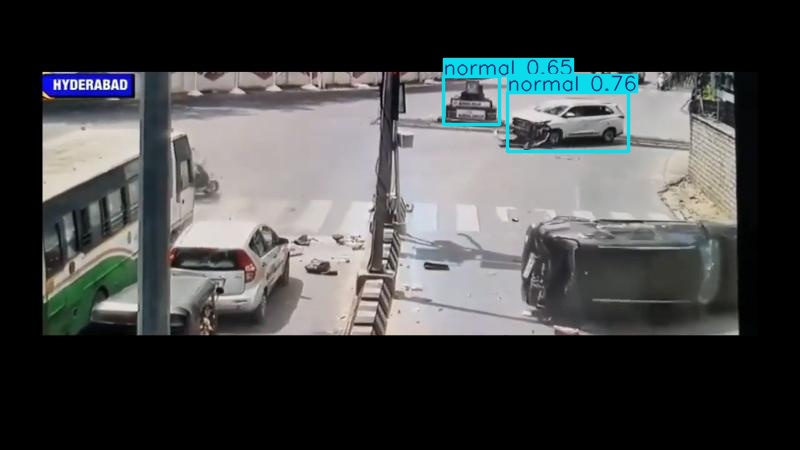

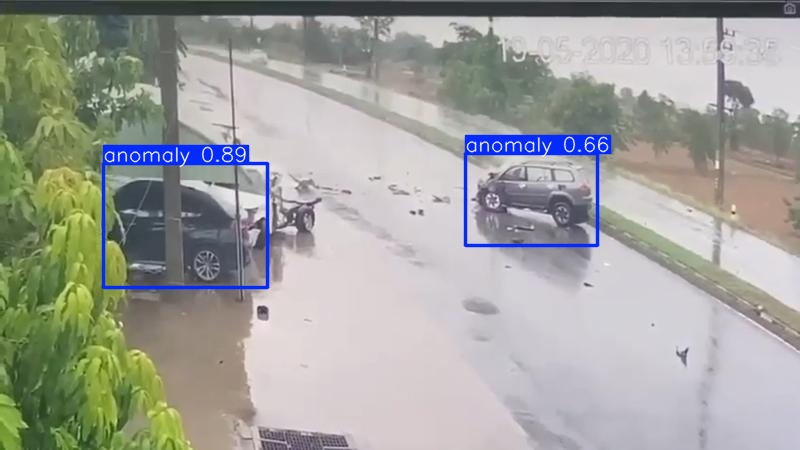

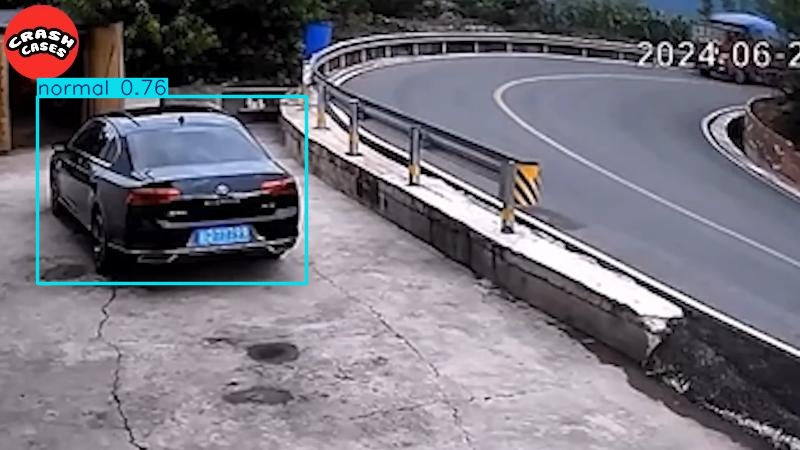

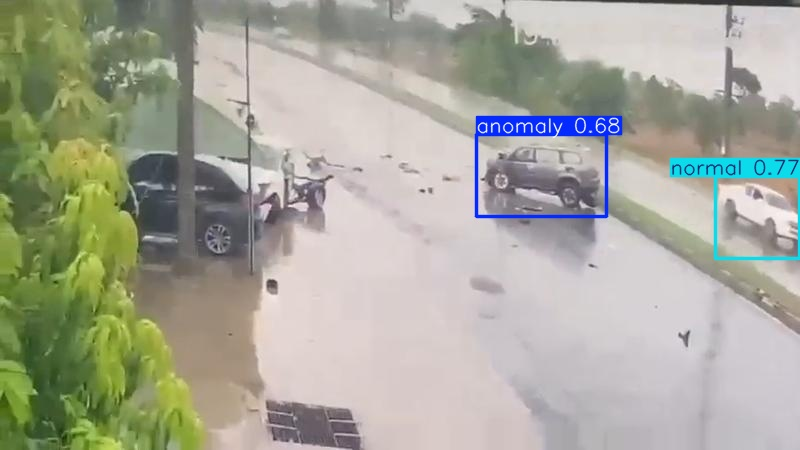

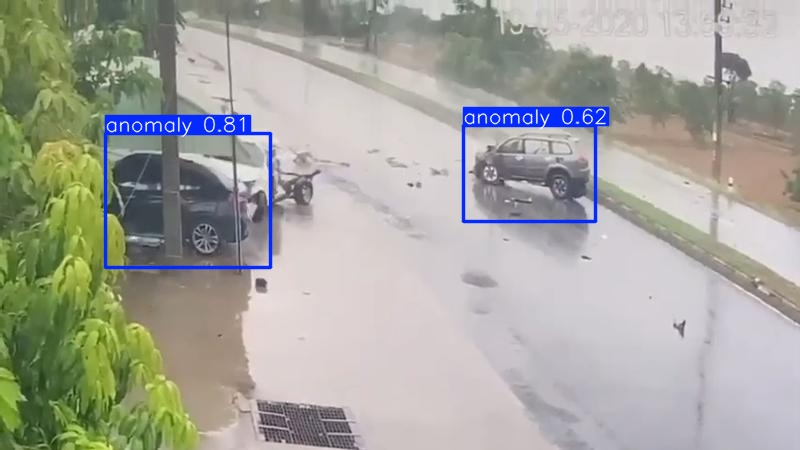

In [29]:
import glob
from IPython.display import Image, display

# Define the base path where the folders are located
base_path = '/content/runs/detect/'

# List all directories that start with 'predict' in the base path
subfolders = [os.path.join(base_path, d) for d in os.listdir(base_path)
              if os.path.isdir(os.path.join(base_path, d)) and d.startswith('predict')]

# Find the latest folder by modification time
latest_folder = max(subfolders, key=os.path.getmtime)

image_paths = glob.glob(f'{latest_folder}/*.jpg')

# Display each image
for image_path in image_paths:
    display(Image(filename=image_path, width=600))
    print("\n")

In [30]:
project.version(dataset.version).deploy(model_type="yolov8", model_path=f"{HOME}/runs/detect/train/")

Dependency ultralytics==8.0.196 is required but found version=8.2.103, to fix: `pip install ultralytics==8.0.196`
Would you like to continue with the wrong version of ultralytics? y/n: y
View the status of your deployment at: https://app.roboflow.com/whop-qepf3/accident-detection-tugas-akhir/50
Share your model with the world at: https://universe.roboflow.com/whop-qepf3/accident-detection-tugas-akhir/model/50


In [ ]:
!zip -r /content/train04122024.zip /content/

from google.colab import files
files.download('/content/train04122024.zip')

  adding: content/ (stored 0%)
  adding: content/.config/ (stored 0%)
  adding: content/.config/gce (stored 0%)
  adding: content/.config/config_sentinel (stored 0%)
  adding: content/.config/.last_survey_prompt.yaml (stored 0%)
  adding: content/.config/configurations/ (stored 0%)
  adding: content/.config/configurations/config_default (deflated 15%)
  adding: content/.config/.last_update_check.json (deflated 22%)
  adding: content/.config/.last_opt_in_prompt.yaml (stored 0%)
  adding: content/.config/logs/ (stored 0%)
  adding: content/.config/logs/2024.12.02/ (stored 0%)
  adding: content/.config/logs/2024.12.02/14.21.35.694368.log (deflated 56%)
  adding: content/.config/logs/2024.12.02/14.21.35.059478.log (deflated 57%)
  adding: content/.config/logs/2024.12.02/14.20.43.528110.log (deflated 93%)
  adding: content/.config/logs/2024.12.02/14.21.22.174281.log (deflated 58%)
  adding: content/.config/logs/2024.12.02/14.21.20.044848.log (deflated 87%)
  adding: content/.config/logs/202